# Spatial + Temporal Synthesis using Fourier Transform

Assume length of the line is $L$

## Spatial Synthesis

**Ricatti**: $\Gamma'(\omega, x)-j\omega \epsilon(x)\Gamma(\omega, x)-\frac{\epsilon'(x)}{2\epsilon(x)}(1-\Gamma^2(\omega, x))=0$

**Approximation**: $1-\Gamma^2(\omega, x)\approx 1$

$$
\Gamma'(\omega, x)-j\omega \epsilon(x)\Gamma(\omega, x)-\frac{\epsilon'(x)}{2\epsilon(x)}=0
$$

Try solving for $\Gamma(\omega, x)$

First order ODE in $x$ with $I(\omega, x)=e^{-\int_0^x j\omega\epsilon(u)du}$

$$
\Gamma'(\omega, x)I(\omega, x)-j\omega\epsilon(x)\Gamma(\omega, x)I(\omega, x)=\frac{\epsilon'(x)}{2\epsilon(x)}I(\omega, x)\\

\Gamma'(\omega, x)I(\omega, x)+\Gamma(\omega, x)I'(\omega, x)=\frac{\epsilon'(x)}{2\epsilon(x)}I(\omega, x)\\

\int_0^Ld\Gamma(\omega, x)I(\omega, x)=\int_0^L\frac{\epsilon'(x)}{2\epsilon(x)}I(\omega, x)dx

$$

Assuming matched load 

$$
\Gamma(\omega, 0)I(\omega, 0)=-\int_0^L\frac{\epsilon'(x)}{2\epsilon(x)}e^{-\int_0^x j\omega\epsilon(u)du}dx\\

\Gamma(\omega, 0)=-\int_0^L\frac{\epsilon'(x)}{2\epsilon(x)}e^{-\int_0^x j\omega\epsilon(u)du}dx
$$

**Substitution: $y(x)=\int_0^x\epsilon(u)du$**

$$
\Gamma(\omega, 0)=-\int_0^{y_L}\frac{\epsilon'(x(y))}{2\epsilon^2(x(y))}e^{-j\omega y}dy
$$

Denote 

$$
\phi(y)=-\frac{\epsilon'(x)}{2\epsilon^2(x)}\times (u(y-y_L)-u(y))\\

\Gamma(\omega, 0)=\mathcal F[\phi(y)]
$$

Thus, instead of taking about $\Gamma(\omega, 0)$, we talk about $\phi(y)$


$$-\int_{\epsilon(0)}^{\epsilon(x)}\frac{d\epsilon}{2\epsilon^2(x)} = \int_0^x\phi(y)dx$$  

$$\epsilon(x)=\frac{1}{\frac{1}{\epsilon(0)}+2\int_0^x\phi(y)dx}$$  


$$\epsilon(x)=\frac{1}{\frac{1}{\epsilon(0)}+2\int_0^x\phi(y)dx}$$

$\phi(y)$ is limited $0\to \int_0^L\epsilon(x)dx$

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import scipy
from scipy import constants, integrate, signal
from scipy.signal import butter, freqz
import torch


%config InlineBackend.figure_format = 'svg'
plt.rcParams['lines.linewidth'] = 0.8

eps0 = constants.epsilon_0
mu0 = constants.mu_0

In [2]:
L = 2e-6
yL = 30*L*eps0

start = 30

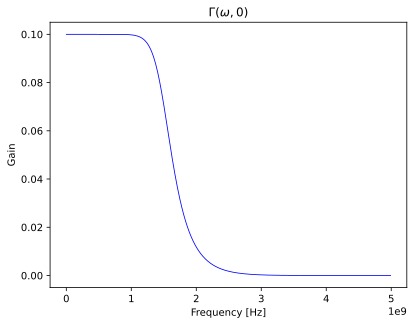

In [3]:
def butter_lowpass(cutoff, fs, order=5):
    nyquist = 0.5 * fs
    normal_cutoff = cutoff / nyquist
    b, a = butter(order, normal_cutoff, btype='low', analog=False)
    return b, a

# Filter parameters
fs = 100.0 * 1e8 # Sample rate (Hz)
cutoff_freq = 15.0 * 1e8 # Desired cutoff frequency (Hz)
order = 6  # Filter order

# Compute the frequency response of the filter
b, a = butter_lowpass(cutoff_freq, fs, order=order)
b = (1e-1)*b
w, h = freqz(b, a, fs=fs)

# Plot the frequency response
plt.figure()
plt.plot(w, abs(h), color = "b")
plt.xlabel('Frequency [Hz]')
plt.ylabel('Gain')
plt.title("$\Gamma(\omega, 0)$")
plt.show()

In [4]:
print(np.min(w))
print(np.max(w))

0.0
4990234375.0


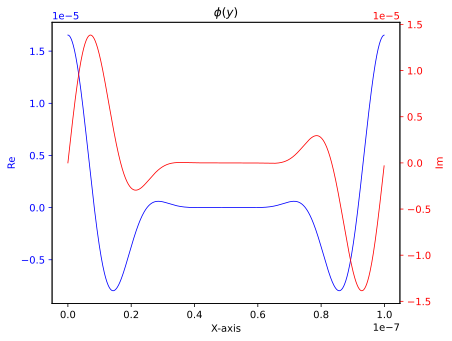

In [5]:
# Compute the inverse Fourier transform of the filter coefficients
N = 1000  # Number of points for the time-domain representation
phi = (np.fft.ifft(np.concatenate((b, np.zeros(N - len(b))))))

# Generate the time array for the filter representation
y = np.arange(0, N) / fs

fig, ax1 = plt.subplots()

ax1.plot(y, np.real(phi), 'b-')
ax1.set_xlabel('X-axis')
ax1.set_ylabel('Re', color='b')
ax1.tick_params('y', colors='b')
ax2 = ax1.twinx()

ax2.plot(y, np.imag(phi), 'r-')
ax2.set_ylabel('Im', color='r')
ax2.tick_params('y', colors='r')
fig.tight_layout()
plt.title("$\phi(y)$")

plt.show()

In [7]:
# x calculations
x = np.linspace(0, L, num=N)

I = scipy.integrate.cumtrapz(phi, x/(15*eps0), initial=0) * 1/(15*eps0)
eps_x = 1/( 1/(start*eps0) - 2*I )

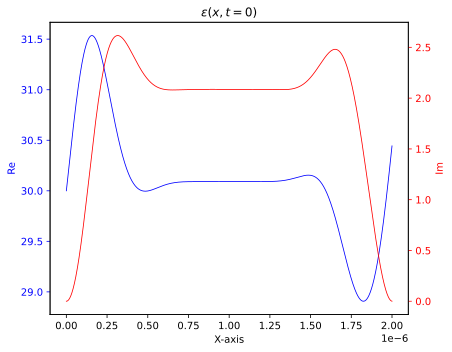

In [8]:
fig, ax1 = plt.subplots()

ax1.plot(x, np.real(eps_x/eps0), 'b-')
ax1.set_xlabel('X-axis')
ax1.set_ylabel('Re', color='b')
ax1.tick_params('y', colors='b')

ax2 = ax1.twinx()

ax2.plot(x, np.imag(eps_x/eps0), 'r-')
ax2.set_ylabel('Im', color='r')
ax2.tick_params('y', colors='r')
fig.tight_layout()
plt.title("$\epsilon(x, t=0)$")

plt.show()

## Temporal Synthesis

**Ricatti**: $\Gamma'(\omega, t)-j\omega \epsilon(t)\Gamma(\omega, t)+\frac{\epsilon'(t)}{2\epsilon(t)}(1-\Gamma^2(\omega, t))=0$

**Approximation**: $1-\Gamma^2(\omega, t)\approx 1$

$$
\Gamma'(\omega, t)-j\omega \epsilon(t)\Gamma(\omega, t)+\frac{\epsilon'(t)}{2\epsilon(t)}=0
$$

Try solving for $\Gamma(\omega, t)$

First order ODE in $x$ with $I(\omega, t)=e^{-\int_0^t j\omega\epsilon(u)du}$

$$
\Gamma'(\omega, t)I(\omega, t)-j\omega\epsilon(t)\Gamma(\omega, t)I(\omega, t)=-\frac{\epsilon'(t)}{2\epsilon(t)}I(\omega, t)\\

\Gamma'(\omega, t)I(\omega, t)+\Gamma(\omega, t)I'(\omega, t)=-\frac{\epsilon'(t)}{2\epsilon(t)}I(\omega, t)\\

\int_0^{\tau}d\Gamma(\omega, t)I(\omega, t)=-\int_0^\tau\frac{\epsilon'(t)}{2\epsilon(t)}I(\omega, t)dt

$$

Assuming matched load 

$$
\Gamma(\omega, \tau)I(\omega, \tau)-\Gamma(\omega, 0)I(\omega, 0)=-\int_0^\tau\frac{\epsilon'(t)}{2\epsilon(t)}e^{-\int_0^tj\omega\epsilon(u)du}dt
$$

**Approximation**: After a long time at high frequency, we have $I(\omega, t)=e^{-\int_0^tj\omega \epsilon(u)du}\to0$

$$
\Gamma(\omega, 0)I(\omega, 0)=\int_0^\tau\frac{\epsilon'(t)}{2\epsilon(t)}e^{-\int_0^tj\omega\epsilon(u)du}dt
$$

**Substitution: $y(t)=\int_0^t\epsilon(u)du$**

$$
\Gamma(\omega, 0)=\int_0^{\tau}\frac{\epsilon'(t(y))}{2\epsilon^2(t(y))}e^{-j\omega y}dy
$$

Denote 

$$
\phi(y)=\frac{\epsilon'(y)}{2\epsilon^2(y)}\times (u(t-\tau)-u(t))\\

\Gamma(\omega, 0)=\mathcal F[\phi(y)]
$$

Thus, instead of taking about $\Gamma(\omega, 0)$, we talk about $\phi(y)$

We solve for 

$$
\frac{y''}{2(y')^2}=\phi(y), y(0)=0, y'(0)=\epsilon(0)
$$

$$\int_0^{\epsilon(y)}\frac{d\epsilon}{2\epsilon^2(y)} = \int_0^y\phi(y)dy$$  



$$\epsilon(t)=\frac{1}{\frac{1}{\epsilon(0)}-2\int_0^t\phi(y)dt}$$

In [9]:
# solve for t

T = 1e-6
t = np.linspace(0, T, num=N)

eps_tx = np.zeros((N, N), dtype=complex)

for i in range(0, N):
    I = scipy.integrate.cumtrapz(phi, t/(15*eps0), initial=0) * 1/(15*eps0)
    eps_t_curr = 1/( 1/(eps_x[i]) - 2*I )
    eps_tx[i, :] = eps_t_curr
    

In [10]:
pd.DataFrame(eps_tx/eps0)

,0,1,2,3,4,5,6,7,8,9,...,990,991,992,993,994,995,996,997,998,999
0,30.000000+0.000000j,30.014969+0.000141j,30.029947+0.000565j,30.044928+0.001272j,30.059904+0.002264j,30.074871+0.003539j,30.089821+0.005099j,30.104748+0.006943j,30.119647+0.009072j,30.134509+0.011484j,...,30.085440+0.014120j,30.100217+0.011458j,30.115064+0.009069j,30.129975+0.006955j,30.144944+0.005118j,30.159965+0.003559j,30.175032+0.002281j,30.190138+0.001285j,30.205279+0.000572j,30.220448+0.000143j
1,30.029953+0.000283j,30.044952+0.000424j,30.059960+0.000849j,30.074971+0.001558j,30.089977+0.002552j,30.104974+0.003830j,30.119954+0.005393j,30.134911+0.007242j,30.149839+0.009375j,30.164732+0.011792j,...,30.115564+0.014432j,30.130371+0.011765j,30.145248+0.009372j,30.160189+0.007254j,30.175187+0.005413j,30.190238+0.003852j,30.205336+0.002572j,30.220473+0.001574j,30.235644+0.000859j,30.250843+0.000430j
2,30.059954+0.001132j,30.074983+0.001275j,30.090021+0.001702j,30.105061+0.002413j,30.120098+0.003410j,30.135124+0.004692j,30.150134+0.006259j,30.165122+0.008111j,30.180080+0.010250j,30.195002+0.012673j,...,30.145736+0.015315j,30.160572+0.012644j,30.175479+0.010246j,30.190450+0.008125j,30.205479+0.006282j,30.220560+0.004718j,30.235688+0.003436j,30.250856+0.002437j,30.266057+0.001722j,30.281287+0.001293j
3,30.089990+0.002553j,30.105049+0.002697j,30.120117+0.003126j,30.135187+0.003840j,30.150254+0.004840j,30.165310+0.006126j,30.180350+0.007698j,30.195367+0.009556j,30.210355+0.011699j,30.225307+0.014129j,...,30.175942+0.016772j,30.190808+0.014097j,30.205745+0.011696j,30.220746+0.009572j,30.235806+0.007726j,30.250917+0.006161j,30.266076+0.004877j,30.281274+0.003878j,30.296506+0.003163j,30.311767+0.002734j
4,30.120048+0.004546j,30.135137+0.004692j,30.150235+0.005124j,30.165335+0.005842j,30.180432+0.006846j,30.195519+0.008136j,30.210588+0.009713j,30.225635+0.011577j,30.240653+0.013727j,30.255635+0.016163j,...,30.206170+0.018805j,30.221067+0.016126j,30.236034+0.013722j,30.251065+0.011596j,30.266155+0.009749j,30.281298+0.008182j,30.296486+0.006898j,30.311715+0.005899j,30.326979+0.005185j,30.342270+0.004757j
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,30.321644+0.007195j,30.336935+0.007346j,30.352236+0.007787j,30.367540+0.008517j,30.382839+0.009537j,30.398129+0.010847j,30.413401+0.012448j,30.428651+0.014339j,30.443870+0.016521j,30.459054+0.018993j,...,30.408921+0.021661j,30.424019+0.018949j,30.439189+0.016516j,30.454423+0.014364j,30.469717+0.012494j,30.485064+0.010909j,30.500458+0.009611j,30.515893+0.008600j,30.531363+0.007879j,30.546861+0.007448j
996,30.352117+0.004616j,30.367440+0.004765j,30.382772+0.005204j,30.398106+0.005932j,30.413436+0.006952j,30.428757+0.008262j,30.444060+0.009864j,30.459341+0.011756j,30.474592+0.013940j,30.489806+0.016414j,...,30.439573+0.019096j,30.454701+0.016376j,30.469901+0.013936j,30.485166+0.011776j,30.500490+0.009900j,30.515868+0.008310j,30.531293+0.007006j,30.546759+0.005991j,30.562260+0.005265j,30.577790+0.004831j
997,30.382702+0.002602j,30.398056+0.002750j,30.413419+0.003187j,30.428784+0.003916j,30.444146+0.004935j,30.459497+0.006246j,30.474832+0.007849j,30.490144+0.009743j,30.505426+0.011929j,30.520671+0.014406j,...,30.470337+0.017101j,30.485495+0.014373j,30.500725+0.011925j,30.516021+0.009760j,30.531376+0.007878j,30.546785+0.006282j,30.562241+0.004973j,30.577738+0.003954j,30.593271+0.003225j,30.608831+0.002788j
998,30.413387+0.001159j,30.428772+0.001306j,30.444166+0.001742j,30.459562+0.002471j,30.474955+0.003491j,30.490338+0.004803j,30.505704+0.006407j,30.521047+0.008304j,30.536360+0.010493j,30.551637+0.012974j,...,30.501200+0.015678j,30.516389+0.012944j,30.531650+0.010490j,30.546976+0.008318j,30.562362+0.006431j,30.577802+0.004830j,30.593290+0.003518j,30.608819+0.002495j,30.624382+0.001763j,30.639975+0.001324j


In [11]:
X, Y = np.meshgrid(t, x)

fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

# Plot the surface with 'viridis' colormap
ax.plot_surface(X, Y, np.real(eps_tx), cmap='plasma')

# Set labels and title
ax.set_xlabel('t')
ax.set_ylabel('x')
ax.set_zlabel('Real Part')
ax.set_title('$Re\ \epsilon(x, t)$')

# Set the color of the axes to white
ax.xaxis.pane.set_color('white')
ax.yaxis.pane.set_color('white')
ax.zaxis.pane.set_color('white')

# Show the plot
plt.show()

In [12]:
X, Y = np.meshgrid(t, x)

fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

# Plot the surface with 'viridis' colormap
ax.plot_surface(X, Y, np.imag(eps_tx), cmap='plasma')

# Set labels and title
ax.set_xlabel('t')
ax.set_ylabel('x')
ax.set_zlabel('Imag Part')
ax.set_title('$Im\ \epsilon(x, t)$')

# Set the color of the axes to white
ax.xaxis.pane.set_color('white')
ax.yaxis.pane.set_color('white')
ax.zaxis.pane.set_color('white')

# Show the plot
plt.show()